In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import contextily
import geopandas
from random import shuffle
from shapely.geometry import Point
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
import random
from sklearn.metrics import r2_score
import seaborn as sns
sns.set()
import xgboost as xgb
from xgboost.sklearn import XGBRegressor
from sklearn import linear_model
import geopandas
import matplotlib as mat
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_predict, GroupKFold
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from rpy2.robjects.vectors import StrVector
from rpy2.robjects.packages import importr
import rpy2.robjects.packages as rpackages

non spatial cv

In [2]:
dane = pd.read_csv("dane.csv")
dane.head()

,Unnamed: 0,...1,x,y,cena,nazwa,link,adres stacji,wielkosc ruchu,godziny otwarcia,...,min_odl_primary,max_odl_primary,avg_odl_primary,palac_kultury,sources.lon,min_odl_stacji,max_odl_stacji,avg_odl_stacji,ile_stacji_r5,ile_stacji_r10
0,1,0,21.090571,52.155782,4.23,NaN,https://www.google.com/search?tbm=lcl&ei=MVGXX...,"Przyczółkowa 304, 02-962 Warszawa",3734.25,Czynne całą dobę,...,5.4,38.3,19.706374,17.1,21.090840,3.7,37.0,19.622314,1,10
1,2,0,21.105992,52.221414,4.29,Circle K,https://www.google.com/search?tbm=lcl&ei=6lCXX...,"Stoczniowców 5, 03-984 Warszawa",3764.25,Czynne całą dobę,...,0.7,33.2,13.992623,13.1,21.105990,2.7,30.1,15.917355,4,23
2,3,0,21.037341,52.162284,4.23,Circle K,https://www.google.com/search?tbm=lcl&ei=RFCXX...,"aleja Jana Rodowicza „Anody” 6, 02-786 Warszawa",6282.00,Czynne całą dobę,...,1.3,36.2,16.416023,13.6,21.037338,3.2,34.9,16.435537,7,24
3,4,0,21.172417,52.209670,4.14,Stacja Paliw ORLEN,https://www.google.com/search?tbm=lcl&ei=90-XX...,"Konopna 11, 04-707 Warszawa",4466.25,Czynne całą dobę,...,3.8,40.1,20.501112,20.7,21.172235,2.7,34.6,22.273554,1,7
4,5,0,21.042291,52.257589,4.26,BP,https://www.google.com/search?tbm=lcl&ei=6U6XX...,"aleja ""Solidarności"" 15, 03-412 Warszawa",4164.00,Czynne całą dobę,...,6.8,34.6,18.207153,11.5,21.042235,3.3,29.2,16.764463,3,15


In [3]:
dane = pd.read_csv("dane.csv")
y = dane.N
dane= dane[["cena", "x", "y", "liczba gwiazdek", "min_odl_trunk", 'max_odl_trunk', 'avg_odl_trunk',
       'min_odl_primary', 'max_odl_primary', 'avg_odl_primary',
       'palac_kultury', 'min_odl_stacji', 'max_odl_stacji',
       'avg_odl_stacji', 'ile_stacji_r5', 'ile_stacji_r10']]
items = dane[["x", "y"]].values.tolist()

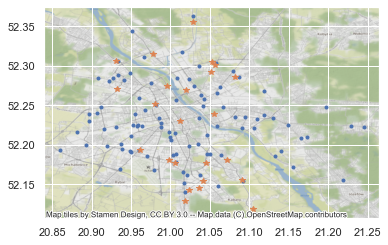

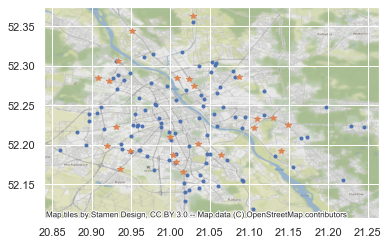

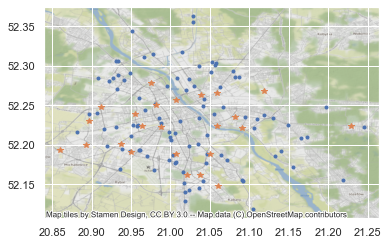

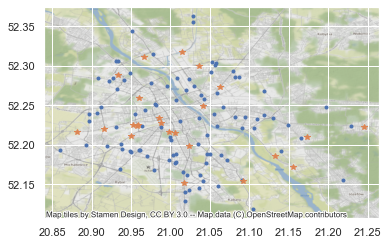

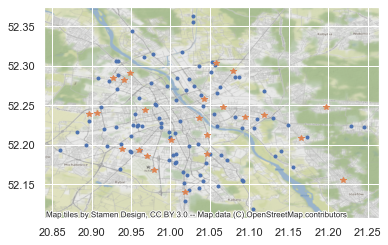

In [4]:
def k_fold_cross_validation(items, k, randomize=False):

    if randomize:
        items = list(items)
        shuffle(items)

    slices = [items[i::k] for i in range(k)]

    for i in range(k):
        validation = slices[i]
        training = [item
                    for s in slices if s is not validation
                    for item in s]
        yield training, validation

if __name__ == '__main__':
    #items = [[1,5],[3,7],[9,2],[3,5], [5,8], [2,5]] #range(97)
    for training, validation in k_fold_cross_validation(items, 5):
        for item in items:
            assert (item in training) ^ (item in validation)
        df_geometry= [Point(xy) for xy in training]
        df_train = geopandas.GeoDataFrame(training, geometry=df_geometry, crs='epsg:4326')

        df_geometry= [Point(xy) for xy in validation]
        df_test = geopandas.GeoDataFrame(validation, geometry=df_geometry, crs='epsg:4326')

        fig,ax=plt.subplots()
        ax.plot(df_train[0],df_train[1], '.')
        ax.plot(df_test[0],df_test[1], '*')
        contextily.add_basemap(ax, crs=df_train.crs.to_string())
        plt.show()

spatial cv

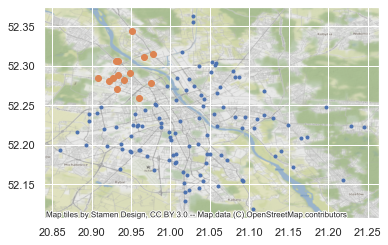

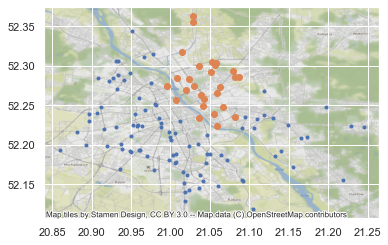

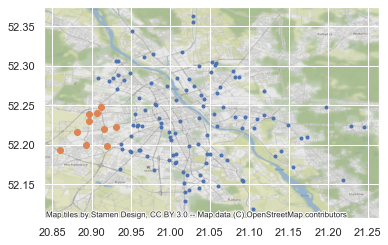

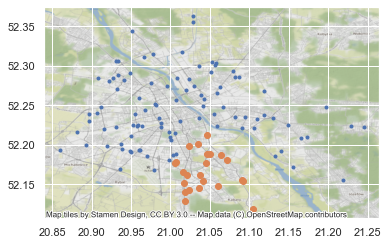

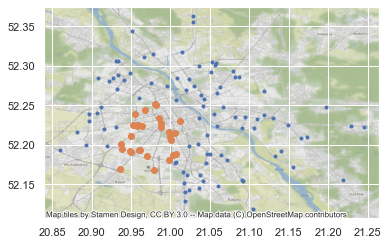

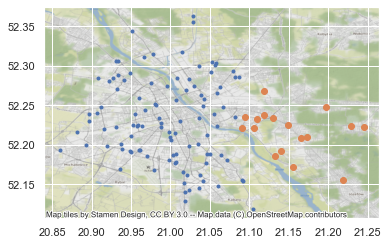

In [108]:
kmeans =  KMeans(init="random",
                    n_clusters=6,
                    n_init=10,
                    max_iter=300,
                    random_state=42)
kmeans.fit(items)

dane['kmeans_cluster'] = list(kmeans.labels_)

slices = [dane[dane.kmeans_cluster == 0][["x", "y"]].values.tolist(),
          dane[dane.kmeans_cluster == 1][["x", "y"]].values.tolist(),
          dane[dane.kmeans_cluster == 2][["x", "y"]].values.tolist(),
          dane[dane.kmeans_cluster == 3][["x", "y"]].values.tolist(),
          dane[dane.kmeans_cluster == 4][["x", "y"]].values.tolist()
          ,dane[dane.kmeans_cluster == 5][["x", "y"]].values.tolist()
         ]

def k_fold_cross_validation(items, k, randomize=False):

    if randomize:
        items = list(items)
        shuffle(items)

    #slices = 

    for i in range(k):
        validation = slices[i]
        training = [item
                    for s in slices if s is not validation
                    for item in s]
        yield training, validation

if __name__ == '__main__':
    #items = [[1,5],[3,7],[9,2],[3,5], [5,8], [2,5]] #range(97)
    for training, validation in k_fold_cross_validation(items, 6):
        for item in items:
            assert (item in training) ^ (item in validation)
        df_geometry= [Point(xy) for xy in training]
        df_train = geopandas.GeoDataFrame(training, geometry=df_geometry, crs='epsg:4326')

        df_geometry= [Point(xy) for xy in validation]
        df_test = geopandas.GeoDataFrame(validation, geometry=df_geometry, crs='epsg:4326')

        fig,ax=plt.subplots()
        ax.plot(df_train[0],df_train[1], '.')
        ax.plot(df_test[0],df_test[1], 'o')
        contextily.add_basemap(ax, crs=df_train.crs.to_string())
        plt.show()

In [58]:
dane['kmeans_cluster'].unique()

array([3, 5, 1, 4, 2, 0])

In [20]:
X_train, X_test, y_train, y_test = train_test_split(dane, y, test_size=0.2, random_state=216)

regressor = RandomForestRegressor(random_state=1223)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
# 120 589
# 145 535
# 167 551
# 192 520
# 216 423

Mean Absolute Error: 423.005625


In [9]:
first_fold_tr= list((X_train[X_train['kmeans_cluster']!=0]).index)
sec_fold_tr= list((X_train[X_train['kmeans_cluster']!=1]).index)
fird_fold_tr= list((X_train[X_train['kmeans_cluster']!=2]).index)
fou_fold_tr= list((X_train[X_train['kmeans_cluster']!=3]).index)
fiv_fold_tr= list((X_train[X_train['kmeans_cluster']!=4]).index)
first_fold_te= list((y_train[X_train['kmeans_cluster']==0]).index)
sec_fold_te= list((y_train[X_train['kmeans_cluster']==1]).index)
fird_fold_te= list((y_train[X_train['kmeans_cluster']==2]).index)
fou_fold_te= list((y_train[X_train['kmeans_cluster']==3]).index)
fiv_fold_te= list((y_train[X_train['kmeans_cluster']==4]).index)

In [106]:
first_fold_tr= X_train[X_train['kmeans_cluster']!=0]
sec_fold_tr= X_train[X_train['kmeans_cluster']!=1]
fird_fold_tr= X_train[X_train['kmeans_cluster']!=2]
fou_fold_tr= X_train[X_train['kmeans_cluster']!=3]
fiv_fold_tr= X_train[X_train['kmeans_cluster']!=4]
first_fold_te= X_train[X_train['kmeans_cluster']==0]
sec_fold_te= X_train[X_train['kmeans_cluster']==1]
fird_fold_te= X_train[X_train['kmeans_cluster']==2]
fou_fold_te= X_train[X_train['kmeans_cluster']==3]
fiv_fold_te= X_train[X_train['kmeans_cluster']==4]

In [107]:
train_indices=[]
test_indices=[]
train_indices = [first_fold_tr ,sec_fold_tr , fird_fold_tr , fou_fold_tr , fiv_fold_tr ]
test_indices = [first_fold_te ,sec_fold_te , fird_fold_te , fou_fold_te , fiv_fold_te ]

Random Forest non-spatial

In [12]:
rf = RandomForestRegressor(random_state = np.random.RandomState(1223))

n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]

random_grid = {'n_estimators': n_estimators}

In [27]:
grid_search_rf = GridSearchCV(estimator = rf, param_grid = random_grid,
                        cv = 5 , n_jobs = -1, verbose = 2, 
                        return_train_score=True, 
                        scoring = 'neg_mean_absolute_error')
grid_search_rf.fit(X_train, y_train)
grid_search_rf.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   36.1s finished


{'n_estimators': 100}

In [28]:
y_prediction_rf = grid_search_rf.predict(X_test)

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_prediction_rf))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_prediction_rf))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_prediction_rf)))
print('R2:', r2_score(y_test, y_prediction_rf))

Mean Absolute Error: 423.005625
Mean Squared Error: 340521.0606515625
Root Mean Squared Error: 583.5418242521804
R2: 0.002360666196528638


In [101]:
dane['k']= dane['kmeans_cluster']+1

In [109]:
from sklearn.model_selection import GroupShuffleSplit
from sklearn.model_selection import GridSearchCV, GroupKFold

group= dane['kmeans_cluster']
gss = GroupKFold(n_splits = 5)
#inner = GroupKFold(n_splits = 5)

for train_index, test_index in gss.split(dane, y, groups=group):
    x_train, x_test = dane.iloc[train_index,:], dane.iloc[test_index,:]
    y_train2, y_test2 = y.iloc[train_index], y.iloc[test_index]
    groups = group.iloc[train_index]
    
gs = GridSearchCV(estimator = rf ,param_grid = random_grid,
                              #cv = inner,
                              n_jobs = None, verbose = 2, 
                              return_train_score=True, 
                              scoring = 'neg_mean_absolute_error')
gs.fit(x_train, y_train2, groups)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:68: FutureWarning: Pass groups=0      3
1      5
2      3
3      5
4      1
      ..
115    3
116    3
117    3
118    4
119    4
Name: kmeans_cluster, Length: 96, dtype: int64 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] n_estimators=100 ................................................
[CV] ................................. n_estimators=100, total=   0.2s
[CV] n_estimators=100 ................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] ................................. n_estimators=100, total=   0.2s
[CV] n_estimators=100 ................................................
[CV] ................................. n_estimators=100, total=   0.2s
[CV] n_estimators=100 ................................................
[CV] ................................. n_estimators=100, total=   0.2s
[CV] n_estimators=100 ................................................
[CV] ................................. n_estimators=100, total=   0.2s
[CV] n_estimators=200 ................................................
[CV] ................................. n_estimators=200, total=   0.4s
[CV] n_estimators=200 ................................................
[CV] ................................. n_estimators=200, total=   0.4s
[CV] n_estimators=200 ................................................
[CV] ................................. n_estimators=200, total=   0.4s
[CV] n_estimators=200 ................................................
[CV] .

[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   56.2s finished


GridSearchCV(estimator=RandomForestRegressor(random_state=RandomState(MT19937) at 0x7FF1C5A82940),
             param_grid={'n_estimators': [100, 200, 300, 400, 500, 600, 700,
                                          800, 900, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=2)

In [110]:
groups.unique()

array([3, 5, 1, 4])

In [119]:
y_new = gs.predict(x_test)

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test2, y_new))
print('Mean Squared Error:', metrics.mean_squared_error(y_test2, y_new))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test2, y_new)))
print('R2:', r2_score(y_test2, y_new))

Mean Absolute Error: 661.7346875
Mean Squared Error: 807727.2630773437
Root Mean Squared Error: 898.736481443445
R2: -0.3468036487360626


In [112]:
#custom_cv = zip(train_indices,test_indices)

#grid_search_rf_2 = GridSearchCV(estimator = rf ,param_grid = random_grid,
#                        cv = custom_cv , n_jobs = None, verbose = 2, 
#                        return_train_score=True, 
 #                       scoring = 'neg_mean_absolute_error')

#grid_search_rf_2
#grid_search_rf_2.fit(X_train, y_train)

#y_prediction_rf_s = grid_search_rf_2.predict(X_test)

#print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_prediction_rf_s))
#print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_prediction_rf_s))
#print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_prediction_rf_s)))
#print('R2:', r2_score(y_test, y_prediction_rf_s))

Text(0.5, 1.0, 'Score vs Num Trees and cross validation')

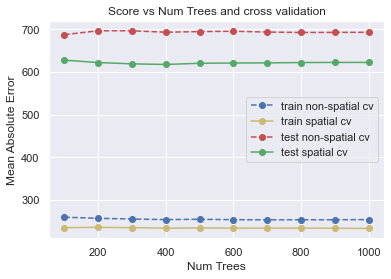

In [113]:
train_scores = abs(grid_search_rf.cv_results_['mean_train_score'])
test_scores = abs(grid_search_rf.cv_results_['mean_test_score'])
test_scores_sp = abs(gs.cv_results_['mean_test_score'])
train_scores_sp = abs(gs.cv_results_['mean_train_score'])
train_time = grid_search_rf.cv_results_['mean_fit_time']
param_values = list(grid_search_rf.cv_results_['param_n_estimators'])

sns.set()
# Plot the scores over the parameter
plt.plot(param_values, train_scores, 'bo--', label = 'train non-spatial cv')
plt.plot(param_values, train_scores_sp, 'yo-', label = 'train spatial cv')
plt.plot(param_values, test_scores, 'ro--', label = 'test non-spatial cv')
plt.plot(param_values, test_scores_sp, 'go-', label = 'test spatial cv')
#plt.ylim(ymin = -2, ymax = 0)
plt.legend()
plt.xlabel('Num Trees')
plt.ylabel('Mean Absolute Error')
plt.title('Score vs Num Trees and cross validation')

In [115]:
len(y_test2)
y_test=y_test2

In [116]:
#grid_search_rf.cv_results_

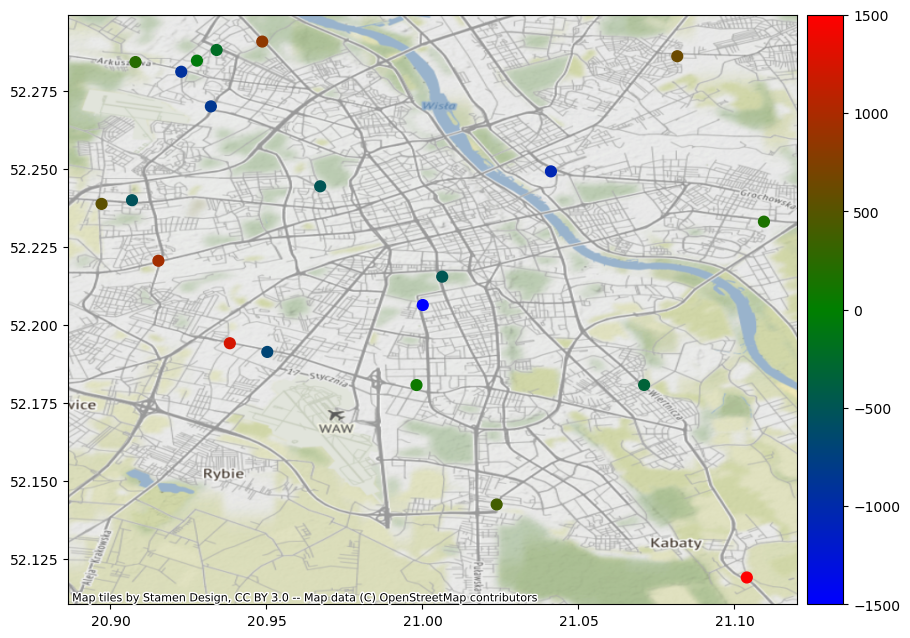

In [117]:
blad_pred=y_test-y_prediction_rf
df = X_test
df=df.reset_index()
blad_pred=blad_pred.reset_index()
df['delta']= blad_pred['N']
df = df[df['x']<21.15]
plt.rcParams.update(plt.rcParamsDefault)

stacje = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.x, df.y), crs='epsg:4326')
cmap = mat.colors.LinearSegmentedColormap.from_list("", ["blue","green","red"])
fig, ax = plt.subplots(figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
ax = stacje.plot(markersize=60,column='delta', cmap=cmap ,legend=True,vmin=-1500, 
                 vmax=1500, ax=ax, cax=cax)
contextily.add_basemap(ax, crs=stacje.crs.to_string())
plt.show()

In [120]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap
              }
    

#rf = RandomForestRegressor(random_state = np.random.RandomState(1223))

custom_cv = zip(train_indices,test_indices)

grid_search_rf = GridSearchCV(estimator = rf, param_grid = random_grid,
                        cv = 5 , n_jobs = -1, verbose = 2, 
                        return_train_score=True, 
                        scoring = 'neg_mean_absolute_error')
grid_search_rf.fit(X_train, y_train)
grid_search_rf.best_params_
y_prediction_rf = grid_search_rf.predict(X_test)

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_prediction_rf))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_prediction_rf))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_prediction_rf)))
print('R2:', r2_score(y_test, y_prediction_rf))

NameError: name 'train_indices' is not defined

Random Forest spatial

In [19]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
    

rf = RandomForestRegressor(random_state = np.random.RandomState(1223))

custom_cv = zip(train_indices,test_indices)

grid_search_rf_s = GridSearchCV(estimator = rf, param_grid = random_grid,
                          cv = custom_cv , n_jobs = -1, verbose = 2)
grid_search_rf_s.fit(X_train, y_train)
grid_search_rf_s.best_params_

Fitting 5 folds for each of 4320 candidates, totalling 21600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   19.7s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed: 25.7min
[Parallel(n_jobs=-1)]: Done 2584 tasks      | elapsed: 33.6min
[Parallel(n_jobs=-1)]: Done 3273 tasks      | elapsed: 42.6min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed: 52.7min
[Parallel(n_jobs=-1)]: Done 4893 tasks      | elapsed: 63.8min
[Parallel(n_jobs=-1)]: Done 5824 tasks      | elapsed: 75.9min
[Parallel(n_jobs=-1)]: Done 6837 tasks      | elapsed: 89.1min
[Parallel(n_jobs=-1)]: Done 7930 tasks      | elapsed: 103.3min
[Parallel(n_jobs=-1)]: Done 9105 tasks      |

{'bootstrap': True,
 'max_depth': 10,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [20]:
y_prediction_rf_s = grid_search_rf_s.predict(X_test)

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_prediction_rf_s))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_prediction_rf_s))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_prediction_rf_s)))
print('R2:', r2_score(y_test, y_prediction_rf_s))

Mean Absolute Error: 559.4211115210979
Mean Squared Error: 529183.4936396928
Root Mean Squared Error: 727.4499939100232
R2: -0.16450940133978653


In [21]:
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}

Spatial CV Experiment

In [22]:
list_of_params= []
np.random.seed(12345678)
random.seed(12345678)
my_list=[1,2,3,4,5,6,7,8,9,10,11,12]
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]

a=1000
while a >=0:
    one_par = {'bootstrap': [True],
                 'max_depth': [random.choice(my_list),random.choice(my_list), random.choice(my_list)],
                 'max_features': ['sqrt'],
                 'min_samples_leaf': [random.choice(my_list), random.choice(my_list), random.choice(my_list)],
                 #'min_samples_split': [random.choice(min_samples_split), random.choice(min_samples_split)],
                 'n_estimators': [311]}
    list_of_params.append(one_par)
    a = a-1

In [ ]:
spatial=[]
non_spatial=[]

for params in list_of_params:

    rf = RandomForestRegressor(random_state = np.random.RandomState(1223))
    custom_cv = zip(train_indices,test_indices)
    grid_search = GridSearchCV(estimator = rf, 
                               param_grid = params,
                               cv = custom_cv,
                               n_jobs = None, 
                               verbose = 2)
    grid_search.fit(X_train, y_train)
    y_pred = grid_search.predict(X_test)
    a= metrics.mean_absolute_error(y_test, y_pred)
    spatial.append(a)
    
    grid_search2 = GridSearchCV(estimator = rf, 
                                param_grid = params,
                                cv = 5 , 
                                n_jobs = None, 
                                verbose = 2)
    grid_search2.fit(X_train, y_train)
    y_pred2 = grid_search2.predict(X_test)
    b= metrics.mean_absolute_error(y_test, y_pred2)
    non_spatial.append(b)
    print(len(spatial))

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   23.9s finished


1
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.2s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.9s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   23.3s finished


2
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   1.0s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   23.1s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   24.2s finished


3
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.9s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   26.0s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.6s finished


4
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.5s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.5s finished


5
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.4s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.6s finished


6
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.2s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   24.3s finished


7
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


8
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


9
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


10
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


11
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


12
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


13
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


14
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


15
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


16
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


17
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


18
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


19
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


20
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


21
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


22
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.9s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.9s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.2s finished


23
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


24
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


25
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


26
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


27
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


28
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


29
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


30
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


31
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


32
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


33
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


34
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.0s finished


35
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.2s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


36
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


37
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


38
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


39
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


40
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


41
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


42
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


43
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.7s finished


44
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


45
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


46
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


47
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


48
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


49
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


50
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


51
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


52
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


53
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


54
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


55
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


56
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


57
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


58
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


59
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


60
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


61
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


62
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


63
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


64
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


65
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


66
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.6s finished


67
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


68
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


69
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


70
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


71
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


72
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


73
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


74
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


75
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


76
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


77
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


78
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


79
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


80
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.4s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.5s finished


81
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


82
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


83
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


84
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


85
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


86
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


87
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


88
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


89
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


90
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


91
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


92
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


93
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


94
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.6s finished


95
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


96
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


97
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


98
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


99
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


100
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


101
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


102
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


103
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


104
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.9s finished


105
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


106
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


107
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


108
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


109
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


110
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


111
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


112
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


113
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


114
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


115
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


116
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


117
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


118
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.2s finished


119
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


120
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


121
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


122
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


123
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


124
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


125
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


126
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


127
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


128
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


129
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


130
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


131
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


132
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


133
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.7s finished


134
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


135
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


136
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


137
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


138
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


139
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


140
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


141
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


142
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


143
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


144
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


145
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


146
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


147
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


148
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


149
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


150
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


151
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


152
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


153
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


154
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


155
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


156
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.9s finished


157
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


158
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


159
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


160
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


161
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


162
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


163
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


164
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


165
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


166
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


167
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


168
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


169
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


170
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


171
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


172
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


173
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


174
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


175
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


176
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


177
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


178
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


179
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


180
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.9s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.7s finished


181
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.4s finished


182
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


183
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


184
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


185
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


186
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


187
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


188
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


189
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


190
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


191
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


192
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


193
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


194
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


195
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


196
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


197
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


198
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


199
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


200
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


201
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


202
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.3s finished


203
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.4s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


204
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


205
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


206
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


207
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


208
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


209
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


210
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


211
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.5s finished


212
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.2s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


213
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


214
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


215
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


216
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


217
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


218
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


219
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


220
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


221
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


222
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


223
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.5s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.2s finished


224
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


225
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


226
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


227
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.2s finished


228
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


229
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


230
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


231
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


232
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


233
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.9s finished


234
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


235
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


236
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


237
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


238
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


239
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


240
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


241
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


242
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


243
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


244
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


245
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.5s finished


246
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.4s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


247
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


248
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


249
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


250
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


251
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


252
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


253
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


254
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


255
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.0s finished


256
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


257
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


258
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


259
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


260
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


261
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


262
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


263
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


264
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


265
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


266
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


267
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


268
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


269
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.3s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.5s finished


270
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


271
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


272
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


273
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


274
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


275
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


276
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.2s finished


277
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


278
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.6s finished


279
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


280
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


281
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


282
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


283
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


284
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


285
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


286
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


287
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


288
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


289
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


290
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


291
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


292
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


293
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


294
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.0s finished


295
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.4s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


296
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


297
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


298
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


299
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


300
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


301
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


302
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


303
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


304
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


305
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


306
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


307
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


308
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


309
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


310
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


311
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


312
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   26.7s finished


313
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


314
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


315
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


316
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


317
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


318
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.9s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


319
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


320
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


321
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


322
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


323
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


324
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


325
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


326
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


327
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


328
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


329
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


330
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


331
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


332
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


333
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


334
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


335
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


336
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


337
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.3s finished


338
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


339
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


340
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


341
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


342
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


343
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.2s finished


344
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


345
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


346
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   23.0s finished


347
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


348
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


349
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


350
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


351
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


352
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


353
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


354
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


355
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


356
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


357
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


358
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


359
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


360
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


361
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   23.1s finished


362
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


363
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


364
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


365
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


366
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


367
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


368
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.2s finished


369
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


370
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


371
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


372
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


373
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


374
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


375
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


376
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


377
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


378
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


379
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


380
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


381
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


382
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


383
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


384
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


385
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.2s finished


386
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.0s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


387
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


388
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


389
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


390
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


391
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


392
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


393
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


394
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


395
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


396
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


397
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


398
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


399
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


400
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


401
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


402
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


403
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


404
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


405
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


406
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


407
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.2s finished


408
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.0s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


409
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


410
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.4s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


411
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


412
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


413
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


414
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


415
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


416
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.7s finished


417
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


418
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


419
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


420
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


421
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


422
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


423
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


424
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


425
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


426
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


427
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


428
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


429
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


430
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


431
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.5s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.8s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.9s finished


432
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


433
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


434
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


435
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


436
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


437
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.5s finished


438
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


439
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


440
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


441
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


442
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


443
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


444
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


445
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


446
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.5s finished


447
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


448
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


449
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


450
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


451
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


452
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


453
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


454
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


455
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


456
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


457
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


458
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


459
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


460
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


461
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.4s finished


462
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


463
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


464
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


465
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


466
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


467
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


468
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


469
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


470
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


471
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.2s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


472
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


473
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


474
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.2s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


475
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


476
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.1s finished


477
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.3s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


478
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


479
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


480
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


481
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


482
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


483
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.9s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   24.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   24.4s finished


484
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.6s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


485
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.9s finished


486
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.9s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   22.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


487
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


488
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


489
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


490
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


491
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


492
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


493
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


494
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


495
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


496
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


497
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


498
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


499
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


500
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.4s finished


501
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


502
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.9s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


503
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


504
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


505
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


506
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.0s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.6s finished


507
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


508
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


509
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.2s finished


510
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.8s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.4s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.9s finished


511
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


512
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.7s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


513
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


514
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.5s finished


515
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.3s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


516
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


517
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


518
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


519
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


520
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


521
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


522
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


523
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


524
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


525
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


526
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.7s finished


527
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


528
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


529
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


530
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.7s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   24.1s finished


531
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


532
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


533
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.8s finished


534
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.3s finished


535
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


536
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


537
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


538
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.0s finished


539
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


540
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.2s finished


541
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


542
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.8s finished


543
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


544
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.1s finished


545
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.1s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.5s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.5s finished


546
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   20.6s finished


547
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


548
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.7s finished


549
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.4s finished


550
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.9s finished


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=10, n_estimators=311 
[CV]  bootst

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.6s finished


551
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=3

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.0s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[CV]  bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=11, max_features=sqrt, min_samples_leaf=12, n_estimators=311 
[C

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


552
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=31

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=11, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bo

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


553
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


554
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   21.3s finished


555
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.5s finished


556
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.5s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.6s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 
[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


[CV]  bootstrap=True, max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV]  bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=8, n_estimators=311 
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.3s finished


557
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=5, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=6, n_estimators=311 
[CV]  bootstrap

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   19.1s finished


558
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=9, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   18.8s finished


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=311 
[CV]  bootstrap

In [ ]:
data_tuples = list(zip(spatial,non_spatial))
wyniki = pd.DataFrame(data_tuples, columns=['MAE for spatial cv','MAE for non-spatial cv'])
wyniki['czy_mniejszy'] = np.where(wyniki['MAE for spatial cv']<= wyniki['MAE for non-spatial cv'], 1, 0)
wyniki

In [ ]:
wyniki.czy_mniejszy.sum()/len(wyniki)*100

In [ ]:
wyniki['MAE for spatial cv'].min()
wyniki['MAE for non-spatial cv'].max()

In [ ]:
#sns.scatterplot(data=wyniki[wyniki.czy_mniejszy==1], x="spatial", y="non-spatial")
plt.style.use('classic')
sns.set()
sns.scatterplot(data=wyniki, x="MAE for spatial cv", y="MAE for non-spatial cv")
#plt.xlim(615, 675)
#plt.ylim(615, 675)

In [ ]:
dane1= wyniki[['MAE for spatial cv', 'czy_mniejszy']]
dane1['type of cv']= 'spatial'
dane1.rename(columns = {'MAE for spatial cv': 'MAE'}, inplace = True)
dane2=wyniki[['MAE for non-spatial cv', 'czy_mniejszy']]
dane2['type of cv']= 'non-spatial'
dane2.rename(columns = {'MAE for non-spatial cv': 'MAE'}, inplace = True)
new= pd.concat([dane1, dane2])
new.head()

In [ ]:
sns.violinplot("type of cv", "MAE", data=new,
               palette=["lightblue", "lightpink"]);

XGB non-spatial

In [ ]:
xgb = XGBRegressor(seed=1223)
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_xgb))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_xgb))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_xgb)))
print('R2:', r2_score(y_test, y_pred_xgb))

Step 2: Tune max_depth and min_child_weight

In [ ]:
param_test1 = {
 'max_depth':range(2,10,1),
 'min_child_weight':range(1,6,1),
'gamma':[i/10.0 for i in range(0,5)],
    'subsample':[i/10.0 for i in range(6,10)],
 'colsample_bytree':[i/10.0 for i in range(6,10)]
}
custom_cv = zip(train_indices,test_indices)
gsearch1 = GridSearchCV(estimator = xgb, 
                        param_grid = param_test1, 
                        scoring='neg_mean_absolute_error',
                        n_jobs=None, 
                        iid=False, 
                        cv=5)
gsearch1.fit(X_train, y_train)
gsearch1.best_params_, gsearch1.best_score_

In [ ]:
y_pred_xgb = gsearch1.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_xgb))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_xgb))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_xgb)))
print('R2:', r2_score(y_test, y_pred_xgb))

XGB spatial

In [ ]:
param_test2 = {
 'max_depth':range(1,10,1),
 'min_child_weight':range(1,6,1),
'gamma':[i/10.0 for i in range(0,5)],
    'subsample':[i/10.0 for i in range(6,10)],
 'colsample_bytree':[i/10.0 for i in range(6,10)]
}
custom_cv = zip(train_indices,test_indices)
gsearch2 = GridSearchCV(estimator = xgb, 
                        param_grid = param_test2,
                        scoring='neg_mean_absolute_error',
                        n_jobs=None,
                        iid=False, 
                        cv=custom_cv)
gsearch2.fit(X_train, y_train)
gsearch2.best_params_, gsearch2.best_score_

In [ ]:
y_pred_xgb_spatial = gsearch2.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_xgb_spatial))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_xgb_spatial))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_xgb_spatial)))
print('R2:', r2_score(y_test, y_pred_xgb_spatial))

In [ ]:
#grid_search_rf.cv_results_

In [ ]:
spatial_xgb = XGBRegressor(
#learning_rate =0.3,
#colsample_bytree=0.6,
#gamma=0.4,
#max_depth= 2,
#min_child_weight= 5,
#subsample= 0.6,
seed=1223)

spatial_xgb.fit(X_train, y_train)
y_p= spatial_xgb.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_p))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_p))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_p)))
print('R2:', r2_score(y_test, y_p))

Step 3: Tune gamma

In [ ]:
param_test3 = {
 'gamma':[i/10.0 for i in range(0,5)]
}
custom_cv = zip(train_indices,test_indices)
gsearch3 = GridSearchCV(estimator = XGBRegressor(learning_rate =0.3, 
                                                 max_depth=3, 
                                                 min_child_weight=3, 
                                                 gamma=0, 
                                                 seed=1223), 
 param_grid = param_test3, scoring='neg_mean_absolute_error', n_jobs=4,iid=False, cv=5)
gsearch3.fit(X_train, y_train)
gsearch3.best_params_, gsearch3.best_score_

Step 4: Tune subsample and colsample_bytree

In [ ]:
param_test4 = {
 'subsample':[i/10.0 for i in range(6,10)],
 'colsample_bytree':[i/10.0 for i in range(6,10)]
}
custom_cv = zip(train_indices,test_indices)
gsearch4 = GridSearchCV(estimator = XGBRegressor(learning_rate =0.3, 
                                                 max_depth=3, 
                                                 min_child_weight=3, 
                                                 gamma=0.0, 
                                                 subsample=0.8, 
                                                 colsample_bytree=0.8,
                                                 seed=1223), 
param_grid = param_test4, scoring='neg_mean_absolute_error',n_jobs=4,iid=False, cv=5)
gsearch4.fit(X_train, y_train)
gsearch4.best_params_, gsearch4.best_score_

Step 5: Tuning Regularization Parameters

In [ ]:
param_test6 = {
 'reg_alpha':[1e-5, 1e-2, 0.1, 1, 100]
}
custom_cv = zip(train_indices,test_indices)
gsearch6 = GridSearchCV(estimator = XGBRegressor(learning_rate =0.3,
                                                 max_depth=3, 
                                                 min_child_weight=3, 
                                                 gamma=0.0, 
                                                 subsample=0.7, 
                                                 colsample_bytree=0.8,
                                                 seed=1223), 
 param_grid = param_test6, scoring='neg_mean_absolute_error',n_jobs=4,iid=False, cv=5)
gsearch6.fit(X_train, y_train)
gsearch6.best_params_, gsearch6.best_score_

Step 6: Reducing Learning Rate

In [ ]:
xgb = XGBRegressor(
learning_rate =0.3,
#colsample_bytree=0.7,
gamma=0.0,
max_depth= 9,
min_child_weight= 2,
subsample= 0.9,
seed=1223)

xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_xgb))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_xgb))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_xgb)))
print('R2:', r2_score(y_test, y_pred_xgb))

In [ ]:
utils = rpackages.importr('utils')
base = importr('base')
packnames = ('ggplot2', 'hexbin')
names_to_install = [x for x in packnames if not rpackages.isinstalled(x)]
if len(names_to_install) > 0:
    utils.install_packages(StrVector(names_to_install))
from rpy2 import robjects
robjects.r('''

f({},{})
''').format(x,y)

In [ ]:
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_xgb))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_xgb))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_xgb)))
print('R2:', r2_score(y_test, y_pred_xgb))

In [ ]:
blad_pred=y_test-y_pred_xgb
X_test=X_test.reset_index()
blad_pred=blad_pred.reset_index()

In [ ]:
X_test['delta']= blad_pred['N']

In [ ]:
plt.rcParams.update(plt.rcParamsDefault)
df = X_test
stacje = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.x, df.y), crs='epsg:4326')
cmap = mat.colors.LinearSegmentedColormap.from_list("", ["blue","green","red"])
ax = stacje.plot(markersize=70,column='delta', figsize=(15, 10), legend=True, cmap=cmap, vmin=-1500, vmax=1500)
contextily.add_basemap(ax, crs=stacje.crs.to_string())
plt.show()

In [ ]:
X_test2=X_test[["cena", "x", "y", "liczba gwiazdek", "min_odl_trunk", 'max_odl_trunk', 'avg_odl_trunk',
       'min_odl_primary', 'max_odl_primary', 'avg_odl_primary',
       'palac_kultury', 'min_odl_stacji', 'max_odl_stacji',
       'avg_odl_stacji', 'ile_stacji_r5', 'ile_stacji_r10']]
X_train2= X_train[["cena", "x", "y", "liczba gwiazdek", "min_odl_trunk", 'max_odl_trunk', 'avg_odl_trunk',
       'min_odl_primary', 'max_odl_primary', 'avg_odl_primary',
       'palac_kultury', 'min_odl_stacji', 'max_odl_stacji',
       'avg_odl_stacji', 'ile_stacji_r5', 'ile_stacji_r10']]

In [ ]:
X_test2 = X_test2.rename(columns = {'cena': 'price',
                                    'liczba gwiazdek': 'n_stars',
                                   'palac_kultury': 'odl_center',
                                   'ile_stacji_r5': 'n_points_r5',
                                    'ile_stacji_r10': 'n_points_r10'
                                   }, inplace = False)
X_train2 = X_train2.rename(columns = {'cena': 'price',
                                    'liczba gwiazdek': 'n_stars',
                                   'palac_kultury': 'odl_center',
                                   'ile_stacji_r5': 'n_points_r5',
                                    'ile_stacji_r10': 'n_points_r10'}, inplace = False)

In [ ]:
xgb2 = XGBRegressor(
learning_rate =0.3,
#colsample_bytree=0.7,
gamma=0.0,
max_depth= 9,
min_child_weight= 2,
subsample= 0.9,
seed=27)

xgb2.fit(X_train2, y_train)
y_pred_xgb2 = xgb2.predict(X_test2)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_xgb2))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_xgb2))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_xgb2)))
print('R2:', r2_score(y_test, y_pred_xgb2))

In [ ]:
explainer = shap.TreeExplainer(xgb2)
shap_values = explainer.shap_values(X_test2)
shap.summary_plot(shap_values, X_test2)

In [ ]:
def plot_f_importance(model):
    importances = model.feature_importances_
    #importances=importances[:-1]
    indices = np.argsort(importances)
    #indices=indices[:-1]
    features = X_train2.columns
    #features=features[:-1]
    plt.title('Feature Importances')
    plt.barh(range(len(indices)), importances[indices], color='b', align='center')
    plt.yticks(range(len(indices)), [features[i] for i in indices])
    plt.xlabel('Relative Importance')
    plt.show()

In [ ]:
plot_f_importance(xgb2)

In [ ]:
shap.dependence_plot('x', shap_values, X_test2, interaction_index='y')

In [ ]:
pred = pd.read_csv("new_pred.csv")
pred_x= pred[["cena", "x", "y", "liczba gwiazdek", "min_odl_trunk", 'max_odl_trunk', 'avg_odl_trunk',
       'min_odl_primary', 'max_odl_primary', 'avg_odl_primary',
       'palac_kultury', 'min_odl_stacji', 'max_odl_stacji',
       'avg_odl_stacji', 'ile_stacji_r5', 'ile_stacji_r10']]
y_pred_new_point = xgb4.predict(pred_x)

Spatial autocorrelation

In [ ]:
import pysal
w = weights.KNN.from_dataframe(db, k=8)
w.transform = 'R'
moran = esda.moran.Moran(db['Pct_Leave'], w)
moran.I
moran.p_sim
plot_moran(moran)

A small enough p-value associated with the Moran’s I of a map allows to reject the hypothesis that the map is random. In other words, we can conclude that the map displays more spatial pattern than we would expect if the values had been randomly allocated to a locations.

On the left panel we can see in gray the empirical distribution generated from simulating 999 random maps with the values of the Pct_Leave variable and then calculating Moran’s I for each of those maps. The blue rug signals the mean. In contrary, the red rug shows Moran’s I calculated for the variable using the geography observed in the dataset. It is clear the value under the observed pattern is significantly higher than under randomness.